<a href="https://colab.research.google.com/github/mawadiod/wsl/blob/master/dcgan_celeba.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import random
import torchvision
import matplotlib.pyplot as plt
import torch.nn as nn

In [ ]:
manual_seed = 999
random.seed(manual_seed)
torch. manual_seed(manual_seed)

image_size = 64
batch_size = 128
workers = 2

nc = 3
ngf = 64
ndf = 64
nz = 100

ngpu = 1
lr = 0.0002
beta1 = 0.5

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
!mkdir dataset
!unzip /gdrive/MyDrive/img_align_celeba.zip -d dataset/

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
mkdir: cannot create directory ‘dataset’: File exists
Archive:  /gdrive/MyDrive/img_align_celeba.zip
replace dataset/img_align_celeba/000001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
None


In [ ]:
transforms = torchvision.transforms.Compose([
            torchvision.transforms.Resize(image_size),
            torchvision.transforms.CenterCrop(image_size),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))
])

In [ ]:
dataset = torchvision.datasets.ImageFolder('dataset/', transform=transforms)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

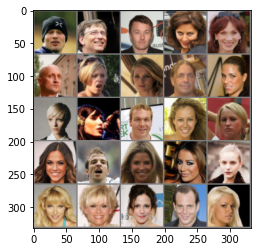

In [ ]:
next_batch = next(iter(dataloader))[0]
next_batch.shape
to_show = torchvision.utils.make_grid(next_batch[:25], nrow=5)
to_show = to_show.permute(1,2,0)
plt.imshow(torchvision.utils.make_grid(to_show, normalize=True))

# Generator

In [ ]:
class Generator(torch.nn.Module):

  def __init__(self, ngpu):
    super().__init__()
    self.ngpu = ngpu
    self.main = torch.nn.Sequential(
        nn.ConvTranspose2d(nz   , ngf*8, 4, 1, 0, bias=False),
        nn.BatchNorm2d(ngf*8),
        nn.ReLU(),

        nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf*4),
        nn.ReLU(),

        nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf*2),
        nn.ReLU(),

        nn.ConvTranspose2d(ngf*2, ngf  , 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf),
        nn.ReLU(),

        nn.ConvTranspose2d(ngf  , nc   , 4, 2, 1, bias=False),
        nn.Tanh()
    )

  def forward(self, input):
    return self.main(input)

In [ ]:
class Discriminator(nn.Module):

  def __init__(self, ngpu):
    super().__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(
        nn.Conv2d(nc,    ndf  , 4, 2, 1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf  , ndf*2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*2),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*4),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*8),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
        nn.Sigmoid()
    )
  
  def forward(self, input):
    return self.main(input)

In [ ]:
def weights_init(m):
  # conv mean, std = 0, 0.02, batch 1, 1.02
  # print(type(m))
  # print(m.__class__)
  # print(m.__class__.__name__)
  classname = m.__class__.__name__
  if classname.find('ConvTranspose2d') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0.0)

In [ ]:
netG = Generator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
  netG = nn.DataParallel(netG, list(range(ngpu)))
netG.apply(weights_init)
# print(netG)

netD = Discriminator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
  netD = nn.DataParallel(netD, list(range(ngpu)))
netD.apply(weights_init)
# print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [ ]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

fake_label = 0
real_label = 1

optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
# checkpoint_ctr = 1
# img_list = []
checkpoint =  torch.load('../gdrive/MyDrive/celeba_gan_models/checkpoint_1.pt')
checkpoint_ctr=2
print(checkpoint.keys())

img_list = checkpoint['img_list']

netG = Generator(ngpu).to(device)
netG.load_state_dict(checkpoint['netG'])

netD = Discriminator(ngpu).to(device)
netD.load_state_dict(checkpoint['netD'])

optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG.load_state_dict(checkpoint['optimizerG'])

optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerD.load_state_dict(checkpoint['optimizerD'])

dict_keys(['netG', 'netD', 'optimizerG', 'optimizerD', 'img_list'])


In [ ]:
num_epochs = 5
G_losses = []
D_losses = []
iters = 0

for epoch in range(num_epochs):

  for batch_num, (real_images, false_labels) in enumerate(dataloader):
    netD.zero_grad()

    real_images = real_images.to(device)
    false_labels = false_labels.to(torch.float).to(device)
    true_labels = torch.ones_like(false_labels, device=device, dtype=torch.float)
    batch_size = false_labels.size(0)

    real_images_out = netD(real_images).view(-1)
    D_x_prob = real_images_out.mean().item()
    real_images_loss= criterion(real_images_out, true_labels)
    real_images_loss.backward()

    noise = torch.randn((batch_size, nz, 1, 1), device=device)
    fake_images = netG(noise)
    fake_images_out = netD(fake_images.detach()).view(-1)
    D_G_z_1 = fake_images_out.mean().item()
    fake_images_loss= criterion(fake_images_out, false_labels)
    fake_images_loss.backward()

    optimizerD.step()
    discriminator_loss = fake_images_loss + real_images_loss
    ############################################
    netG.zero_grad()
    fake_images_out = netD(fake_images).view(-1)
    D_G_z_2 = fake_images_out.mean().item()
    generator_loss = criterion(fake_images_out, true_labels)
    generator_loss.backward()
    optimizerG.step()

    if batch_num % 100 == 0:
      print(f'epoch {epoch+1}/{num_epochs}, batch {batch_num}/{len(dataloader)}')
      print(f'\tGenerator loss {generator_loss.item():.4f}, Discriminator loss {discriminator_loss.item():.4f}')
      print(f'\tD(x) prob: {D_x_prob:.4f}, D(G(z1)) prob: {D_G_z_1:.4f}, D(G(z2)) prob {D_G_z_2:.4f}')

    G_losses.append(generator_loss.item())
    D_losses.append(discriminator_loss.item())

    if (iters % 1000 == 0) or ( (epoch == num_epochs-1) and (batch_num == len(dataloader)-1) ):
      with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
        temp_imgs = torchvision.utils.make_grid(fake, normalize=True)
        img_list.append(temp_imgs)
    
    iters+=1

  checkpoint = {
    'netG': netG.state_dict(),
    'netD': netD.state_dict(),
    'optimizerG': optimizerG.state_dict(),
    'optimizerD': optimizerD.state_dict(),
    'img_list': img_list
  }
  torch.save(checkpoint, '../gdrive/MyDrive/celeba_gan_models/checkpoint_'+str(checkpoint_ctr)+'.pt')
  checkpoint_ctr += 1


epoch 1/5, batch 0/1583
	Generator loss 3.4753, Discriminator loss 0.4354
	D(x) prob: 0.9076, D(G(z1)) prob: 0.2549, D(G(z2)) prob 0.0445
epoch 1/5, batch 100/1583
	Generator loss 5.0965, Discriminator loss 0.8337
	D(x) prob: 0.9630, D(G(z1)) prob: 0.4900, D(G(z2)) prob 0.0090
epoch 1/5, batch 200/1583
	Generator loss 2.4319, Discriminator loss 0.3755
	D(x) prob: 0.8325, D(G(z1)) prob: 0.1475, D(G(z2)) prob 0.1122
epoch 1/5, batch 300/1583
	Generator loss 2.7520, Discriminator loss 0.4729
	D(x) prob: 0.6932, D(G(z1)) prob: 0.0624, D(G(z2)) prob 0.0948
epoch 1/5, batch 400/1583
	Generator loss 4.1884, Discriminator loss 0.6099
	D(x) prob: 0.9452, D(G(z1)) prob: 0.3662, D(G(z2)) prob 0.0223
epoch 1/5, batch 500/1583
	Generator loss 6.6083, Discriminator loss 0.9910
	D(x) prob: 0.9853, D(G(z1)) prob: 0.5579, D(G(z2)) prob 0.0023
epoch 1/5, batch 600/1583
	Generator loss 2.6912, Discriminator loss 0.4282
	D(x) prob: 0.7557, D(G(z1)) prob: 0.0985, D(G(z2)) prob 0.0986
epoch 1/5, batch 700/1

In [ ]:
# # !ls ../gdrive/MyDrive/
# # !mkdir ../gdrive/MyDrive/celeba_gan_models/
# checkpoint_ctr = 1
# checkpoint = {
#   'netG': netG.state_dict(),
#   'netD': netD.state_dict(),
#   'optimizerG': optimizerG.state_dict(),
#   'optimizerD': optimizerD.state_dict(),
#   'img_list': img_list
# }
# torch.save(checkpoint, '../gdrive/MyDrive/celeba_gan_models/checkpoint_'+str(checkpoint_ctr)+'.pt')
# checkpoint_ctr += 1

In [ ]:
iters    

7915

In [ ]:
# !ls ../gdrive/MyDrive/celeba_gan_models/

checkpoint_1.pt


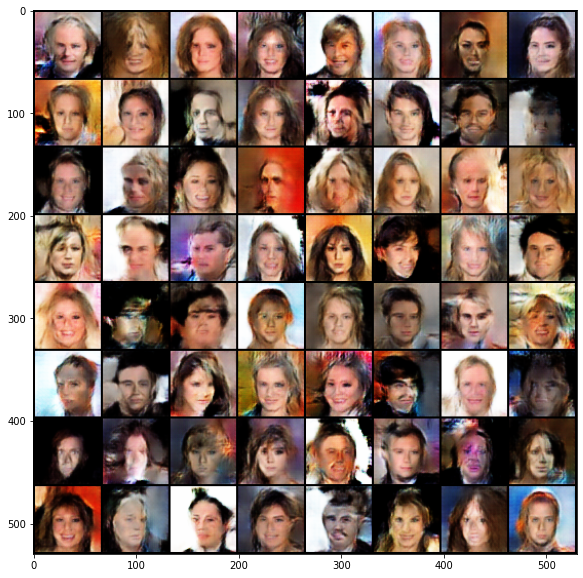

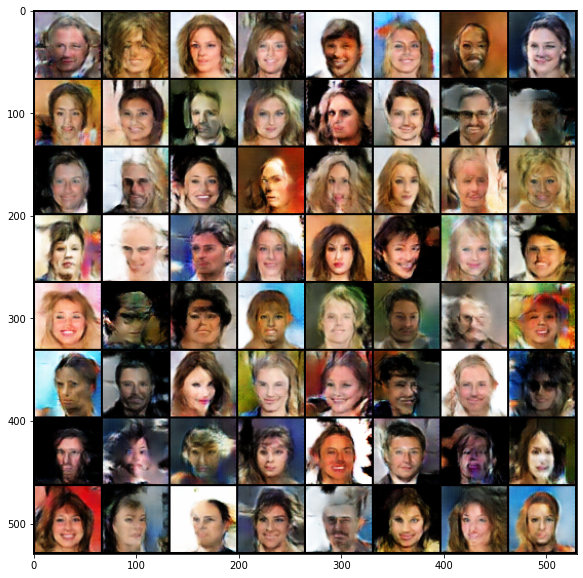

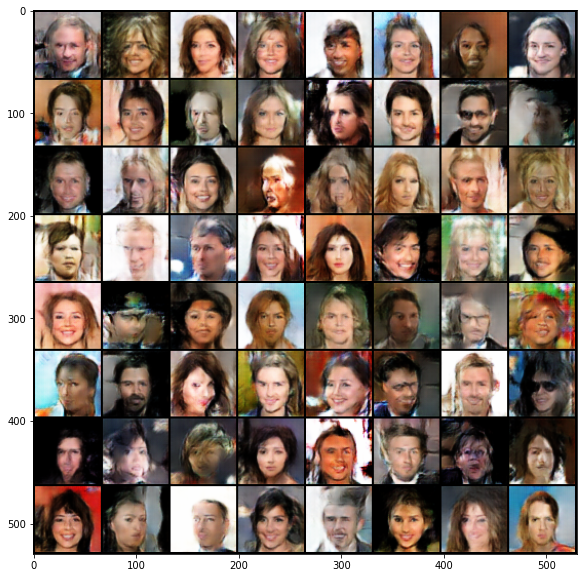

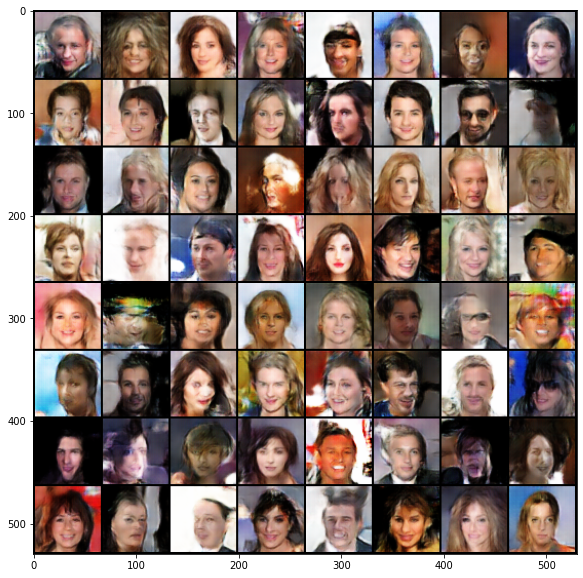

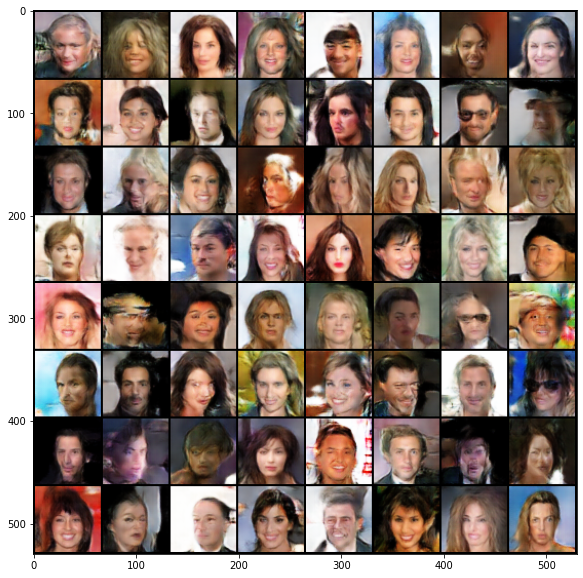

...

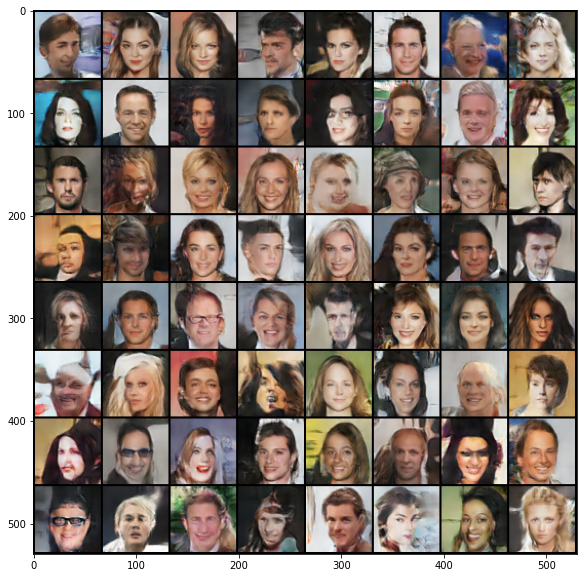

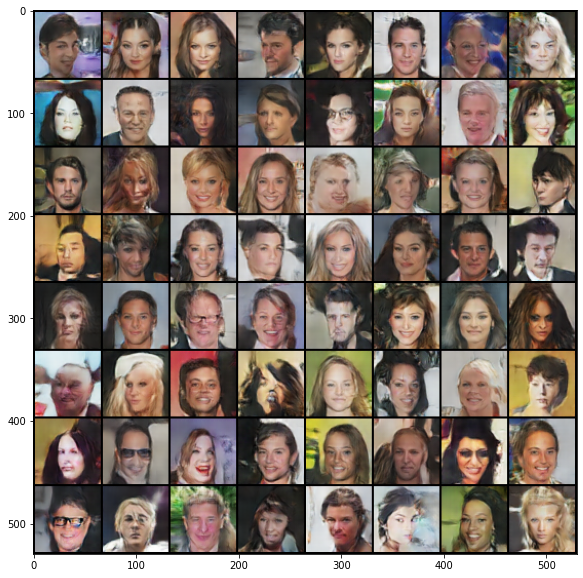

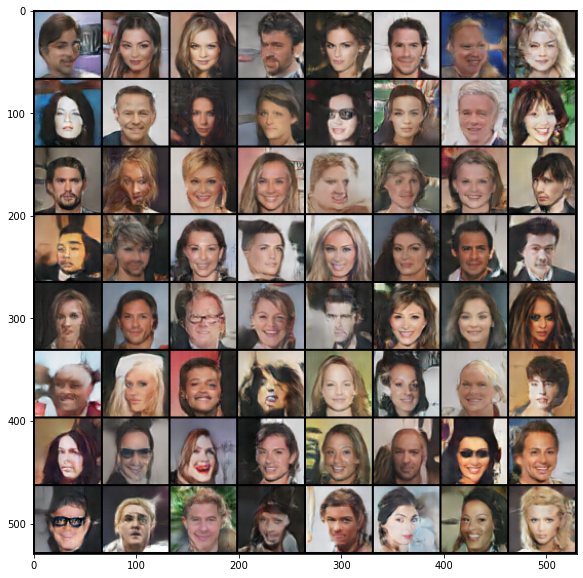

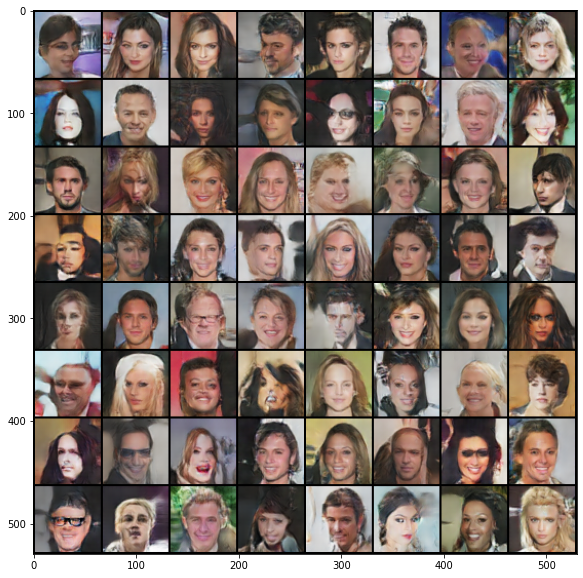

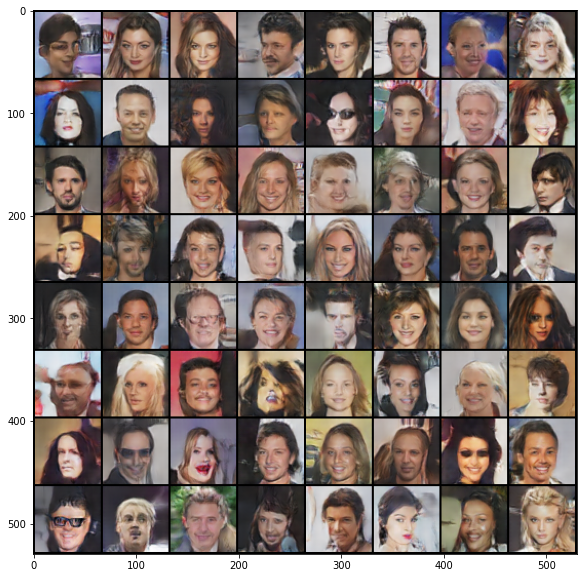

In [ ]:
for a in img_list:
  plt.figure(figsize=(10,10))
  plt.imshow(a.permute(1,2,0), )

In [ ]:
# img_list2 = img_list.copy()